# Import libraries, dataset and look at target variable

In [1]:
# Step: Importing everything I might possibly need
from sqlalchemy import create_engine

import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

import warnings
warnings.filterwarnings("ignore")

from scipy.stats import stats, skew, skewtest, chi2_contingency
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn import metrics
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

from pathlib import Path
import joblib

In [2]:
# Step: SQL query to join and pull all the tables
query = """
    SELECT *
    FROM churn_status cs
    LEFT JOIN account a
    ON cs.customer_id = a.customer_id
    LEFT JOIN account_usage au
    ON a.account_id = au.account_id
    LEFT JOIN customer c
    ON a.customer_id = c.customer_id
    LEFT JOIN city ct
    ON c.zip_code = ct.zip_code;
"""

In [3]:
# Step: Connnection to heicoders database and executing off SQL query, saving data to a df
ENDPOINT = 'heicoders-playground.c2ced10ceyki.ap-southeast-1.rds.amazonaws.com'
PORT = 3306
USERNAME = 'student300'
PASSWORD = 'heicoders_AI300'
DBNAME = 'ai300_capstone'

database_conn = create_engine(f'mysql+pymysql://{USERNAME}:{PASSWORD}@{ENDPOINT}/{DBNAME}')

df = pd.read_sql(query, database_conn)
df

,customer_id,status,churn_label,churn_category,churn_reason,account_id,customer_id,tenure_months,num_referrals,has_internet_service,...,senior_citizen,married,num_dependents,zip_code,area_id,zip_code,city,latitutde,longitude,population
0,0013-EXCHZ,Churned,Yes,Dissatisfaction,Network reliability,BFIN-DLMOA,0013-EXCHZ,3,3,Yes,...,Yes,Yes,0,93010,607,93010,Camarillo,34.227846,-119.079903,42853
1,0014-BMAQU,Stayed,No,,,AFEO-XOOCP,0014-BMAQU,63,8,Yes,...,No,Yes,0,94558,963,94558,Napa,38.489789,-122.270110,63947
2,0016-QLJIS,Stayed,No,,,DEMQ-MFXWC,0016-QLJIS,65,3,Yes,...,No,Yes,1,95681,1390,95681,Sheridan,38.984756,-121.345074,1219
3,0019-EFAEP,Stayed,No,,,AIPP-VTDXJ,0019-EFAEP,72,0,Yes,...,No,No,0,91942,303,91942,La Mesa,32.782501,-117.016110,24005
4,0019-GFNTW,Stayed,No,,,CJHA-SRKIB,0019-GFNTW,56,0,Yes,...,No,No,0,93441,716,93441,Los Olivos,34.704340,-120.026090,1317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,9848-JQJTX,Stayed,No,,,ZTCJ-AYASC,9848-JQJTX,72,0,Yes,...,No,No,0,90291,94,90291,Venice,33.991782,-118.479229,31021
7039,9921-ZVRHG,Churned,Yes,Competitor,Competitor had better devices,WKQW-QPWUM,9921-ZVRHG,14,0,Yes,...,No,No,0,93673,819,93673,Traver,36.456091,-119.486225,646
7040,9938-TKDGL,Stayed,No,,,VKPX-MVNBC,9938-TKDGL,68,9,Yes,...,No,Yes,3,93544,755,93544,Llano,34.500091,-117.765862,1220
7041,9938-ZREHM,Stayed,No,,,PQGJ-VYMBE,9938-ZREHM,37,4,Yes,...,No,Yes,0,93033,615,93033,Oxnard,34.156629,-119.117218,77791


churn_label
No     5174
Yes    1817
         52
Name: count, dtype: int64


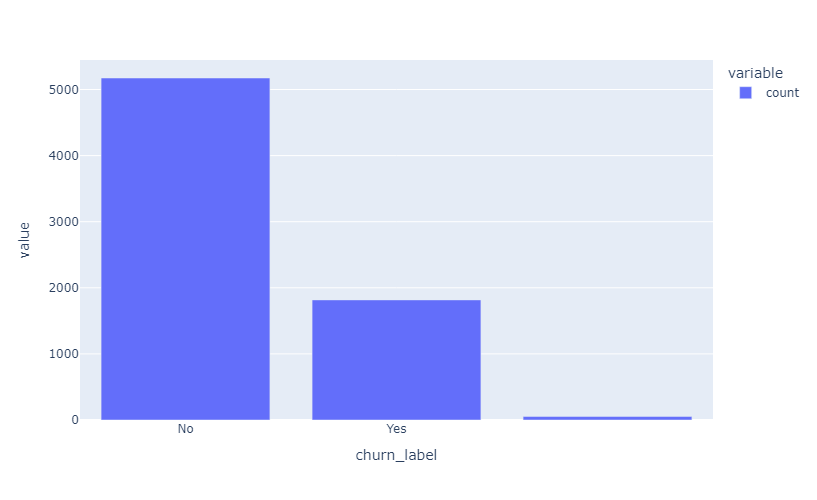

In [4]:
# Step: Exploring the target column, churn_label
# Observation: 52 blanks; to explore further
print(df['churn_label'].value_counts())

fig = px.bar(df['churn_label'].value_counts(), width=800, height=500)
fig.show()

In [5]:
# Step: Exploring the 52 blanks further
# Observation: 52 blanks are due to having been deceased or moved away from the US. 
# Such individuals would no longer be contactabe or require further telco services, and hence cannot be reached out to to prevent "churn".
# Futher action: To filter out these 52 entries 
filtered_df = df[df['churn_label'].isin([''])]
filtered_df

,customer_id,status,churn_label,churn_category,churn_reason,account_id,customer_id,tenure_months,num_referrals,has_internet_service,...,senior_citizen,married,num_dependents,zip_code,area_id,zip_code,city,latitutde,longitude,population
25,0196-VULGZ,Churned,,Other,Deceased,FQMD-JCIWF,0196-VULGZ,6,1,Yes,...,Yes,Yes,0,92620,531,92620,Irvine,33.716136,-117.752574,26419
95,0568-ONFPC,Churned,,Other,Moved,ADHD-XTYYU,0568-ONFPC,5,1,No,...,No,Yes,1,94112,899,94112,San Francisco,37.720498,-122.443119,73117
167,0991-BRRFB,Churned,,Other,Deceased,BVDK-KSARZ,0991-BRRFB,18,0,Yes,...,No,No,0,92883,601,92883,Corona,33.762351,-117.488725,13188
344,2108-XWMPY,Churned,,Other,Moved,AGOK-EXYMU,2108-XWMPY,3,0,Yes,...,No,No,0,92230,390,92230,Cabazon,33.929812,-116.760580,2355
653,3871-IKPYH,Churned,,Other,Moved,AWKP-AMEVV,3871-IKPYH,1,0,Yes,...,Yes,No,0,93010,607,93010,Camarillo,34.227846,-119.079903,42853
944,2634-HCZGT,Churned,,Other,Moved,JTUS-OEGTA,2634-HCZGT,53,1,Yes,...,Yes,Yes,0,95126,1107,95126,San Jose,37.327069,-121.916819,27023
1050,2003-CKLOR,Churned,,Other,Moved,GULX-ALMUE,2003-CKLOR,66,0,Yes,...,No,No,0,96047,1553,96047,Igo,40.524535,-122.647172,911
1076,2884-GBPFB,Churned,,Other,Moved,IBEM-KAXFY,2884-GBPFB,35,4,Yes,...,No,Yes,0,93442,717,93442,Morro Bay,35.369553,-120.763864,10909
1109,4512-ZUIYL,Churned,,Other,Moved,IUOL-CLPVE,4512-ZUIYL,2,0,Yes,...,No,No,0,94089,889,94089,Sunnyvale,37.421633,-122.009613,16985
1398,0378-NHQXU,Churned,,Other,Deceased,YEUK-XZFIQ,0378-NHQXU,17,7,Yes,...,No,Yes,0,94080,886,94080,South San Francisco,37.654436,-122.426468,60599


In [6]:
# Step: SQL query to join and pull all the tables, filtering out the 52 decesased / moved
# Step: Executing of query and updating df
query = """
    SELECT *
    FROM churn_status cs
    LEFT JOIN account a
    ON cs.customer_id = a.customer_id
    LEFT JOIN account_usage au
    ON a.account_id = au.account_id
    LEFT JOIN customer c
    ON a.customer_id = c.customer_id
    LEFT JOIN city ct
    ON c.zip_code = ct.zip_code
    WHERE cs.churn_reason NOT IN ('Deceased', 'Moved');
"""

df = pd.read_sql(query, database_conn)

In [7]:
# Step: Re-label churn_label from No and Yes into 0 and 1 respectively
def change_churn_label_to_num(churn_label):
    if churn_label == 'No':
        return 0
    else:
        return 1

df['churn_label'] = df['churn_label'].apply(change_churn_label_to_num)
df.head(50)

,customer_id,status,churn_label,churn_category,churn_reason,account_id,customer_id,tenure_months,num_referrals,has_internet_service,...,senior_citizen,married,num_dependents,zip_code,area_id,zip_code,city,latitutde,longitude,population
0,0013-EXCHZ,Churned,1,Dissatisfaction,Network reliability,BFIN-DLMOA,0013-EXCHZ,3,3,Yes,...,Yes,Yes,0,93010,607,93010,Camarillo,34.227846,-119.079903,42853
1,0014-BMAQU,Stayed,0,,,AFEO-XOOCP,0014-BMAQU,63,8,Yes,...,No,Yes,0,94558,963,94558,Napa,38.489789,-122.270110,63947
2,0016-QLJIS,Stayed,0,,,DEMQ-MFXWC,0016-QLJIS,65,3,Yes,...,No,Yes,1,95681,1390,95681,Sheridan,38.984756,-121.345074,1219
3,0019-EFAEP,Stayed,0,,,AIPP-VTDXJ,0019-EFAEP,72,0,Yes,...,No,No,0,91942,303,91942,La Mesa,32.782501,-117.016110,24005
4,0019-GFNTW,Stayed,0,,,CJHA-SRKIB,0019-GFNTW,56,0,Yes,...,No,No,0,93441,716,93441,Los Olivos,34.704340,-120.026090,1317
5,0020-INWCK,Stayed,0,,,CDSG-JLJOW,0020-INWCK,71,9,Yes,...,No,Yes,2,93286,685,93286,Woodlake,36.464635,-119.094348,8870
6,0036-IHMOT,Stayed,0,,,EDRJ-TSFHQ,0036-IHMOT,55,10,Yes,...,No,Yes,3,93648,803,93648,Parlier,36.622237,-119.521126,12587
7,0052-DCKON,Stayed,0,,,GGNP-KVFOQ,0052-DCKON,66,9,Yes,...,No,Yes,0,90063,53,90063,Los Angeles,34.044271,-118.185237,55668
8,0052-YNYOT,Stayed,0,,,BTJY-YSXTR,0052-YNYOT,67,0,No,...,No,No,0,92231,391,92231,Calexico,32.690654,-115.431225,27804
9,0060-FUALY,Stayed,0,,,AUVC-CVWLX,0060-FUALY,59,4,Yes,...,No,Yes,0,90003,3,90003,Los Angeles,33.964131,-118.272783,58198


In [8]:
# Step: Exploring the status, churn_reason & churn_category from the churn table further
print(list(df['status'].unique()))
print(df['status'].nunique())

print(list(df['churn_category'].unique()))
print(df['churn_category'].nunique())

print(list(df['churn_reason'].unique()))
print(df['churn_reason'].nunique())

['Churned', 'Stayed', 'Joined']
3
['Dissatisfaction', '', 'Competitor', 'Attitude', 'Price', 'Other']
6
['Network reliability', '', 'Competitor had better devices', 'Attitude of support person', 'Competitor offered higher download speeds', 'Competitor made better offer', 'Long distance charges', 'Competitor offered more data', 'Attitude of service provider', 'Price too high', 'Product dissatisfaction', 'Service dissatisfaction', 'Poor expertise of online support', "Don't know", 'Extra data charges', 'Limited range of services', 'Lack of affordable download/upload speed', 'Poor expertise of phone support', 'Lack of self-service on Website']
19


# Data cleaning

In [9]:
# Step: Removing duplicated columns from df (for cleanliness)
df = df.loc[:,~df.columns.duplicated()].copy()
df

,customer_id,status,churn_label,churn_category,churn_reason,account_id,tenure_months,num_referrals,has_internet_service,internet_type,...,age,senior_citizen,married,num_dependents,zip_code,area_id,city,latitutde,longitude,population
0,0013-EXCHZ,Churned,1,Dissatisfaction,Network reliability,BFIN-DLMOA,3,3,Yes,Fiber Optic,...,75,Yes,Yes,0,93010,607,Camarillo,34.227846,-119.079903,42853
1,0014-BMAQU,Stayed,0,,,AFEO-XOOCP,63,8,Yes,Fiber Optic,...,52,No,Yes,0,94558,963,Napa,38.489789,-122.270110,63947
2,0016-QLJIS,Stayed,0,,,DEMQ-MFXWC,65,3,Yes,Cable,...,43,No,Yes,1,95681,1390,Sheridan,38.984756,-121.345074,1219
3,0019-EFAEP,Stayed,0,,,AIPP-VTDXJ,72,0,Yes,Fiber Optic,...,32,No,No,0,91942,303,La Mesa,32.782501,-117.016110,24005
4,0019-GFNTW,Stayed,0,,,CJHA-SRKIB,56,0,Yes,DSL,...,39,No,No,0,93441,716,Los Olivos,34.704340,-120.026090,1317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6986,9848-JQJTX,Stayed,0,,,ZTCJ-AYASC,72,0,Yes,Fiber Optic,...,52,No,No,0,90291,94,Venice,33.991782,-118.479229,31021
6987,9921-ZVRHG,Churned,1,Competitor,Competitor had better devices,WKQW-QPWUM,14,0,Yes,Fiber Optic,...,44,No,No,0,93673,819,Traver,36.456091,-119.486225,646
6988,9938-TKDGL,Stayed,0,,,VKPX-MVNBC,68,9,Yes,Fiber Optic,...,38,No,Yes,3,93544,755,Llano,34.500091,-117.765862,1220
6989,9938-ZREHM,Stayed,0,,,PQGJ-VYMBE,37,4,Yes,DSL,...,41,No,Yes,0,93033,615,Oxnard,34.156629,-119.117218,77791


In [10]:
# Step: Checking numeric and cat variables for missing data
# Observation: No missing data points (whew)

num_col = df.select_dtypes(exclude='object')
print("Numeric")
print(num_col.isnull().sum())

print("")

print("Categorical")
cat_col = df.select_dtypes(exclude=['int64', 'float64'])
print(cat_col.isnull().sum())

Numeric
churn_label                      0
tenure_months                    0
num_referrals                    0
avg_long_distance_fee_monthly    0
total_long_distance_fee          0
avg_gb_download_monthly          0
total_monthly_fee                0
total_charges_quarter            0
total_refunds                    0
age                              0
num_dependents                   0
zip_code                         0
area_id                          0
latitutde                        0
longitude                        0
population                       0
dtype: int64

Categorical
customer_id                 0
status                      0
churn_category              0
churn_reason                0
account_id                  0
has_internet_service        0
internet_type               0
has_unlimited_data          0
has_phone_service           0
has_multiple_lines          0
has_premium_tech_support    0
has_online_security         0
has_online_backup           0
has_device_prote

In [11]:
# Step: Check for duplicates
# Observation: 0 duplicated rows (whew)

duplicates = df.duplicated()
duplicates_counter = 0
for i in duplicates:
    if i == True:
        duplicates_counter += 1
    else:
        pass
print(duplicates_counter)

0


In [12]:
# Step: Viewing key info in each column (note: this code was taken from a classmate in AI200 who did very well)

for col in df.columns:
    value_counts_series = df[col].value_counts().sort_index()
    number_unique = len(value_counts_series)
    if number_unique < 20:
        print(value_counts_series)
    else:
        print(col, "-", number_unique, "unique values -", df[col].dtype)
        print(list(value_counts_series.index)[:100], ", ...")
        min_value = (value_counts_series.index)[0]
        max_value = (value_counts_series.index)[-1]
        print(f"MIN - {min_value} MAX - {max_value}")
    print("==========================================")

customer_id - 6991 unique values - object
['0002-ORFBO', '0003-MKNFE', '0004-TLHLJ', '0011-IGKFF', '0013-EXCHZ', '0013-MHZWF', '0013-SMEOE', '0014-BMAQU', '0015-UOCOJ', '0016-QLJIS', '0017-DINOC', '0017-IUDMW', '0018-NYROU', '0019-EFAEP', '0019-GFNTW', '0020-INWCK', '0020-JDNXP', '0021-IKXGC', '0022-TCJCI', '0023-HGHWL', '0023-UYUPN', '0023-XUOPT', '0027-KWYKW', '0030-FNXPP', '0031-PVLZI', '0032-PGELS', '0036-IHMOT', '0040-HALCW', '0042-JVWOJ', '0042-RLHYP', '0048-LUMLS', '0048-PIHNL', '0052-DCKON', '0052-YNYOT', '0056-EPFBG', '0057-QBUQH', '0058-EVZWM', '0060-FUALY', '0064-SUDOG', '0064-YIJGF', '0067-DKWBL', '0068-FIGTF', '0071-NDAFP', '0074-HDKDG', '0076-LVEPS', '0078-XZMHT', '0080-EMYVY', '0080-OROZO', '0082-LDZUE', '0082-OQIQY', '0083-PIVIK', '0089-IIQKO', '0093-EXYQL', '0093-XWZFY', '0094-OIFMO', '0096-BXERS', '0096-FCPUF', '0098-BOWSO', '0100-DUVFC', '0103-CSITQ', '0104-PPXDV', '0106-GHRQR', '0106-UGRDO', '0107-WESLM', '0107-YHINA', '0111-KLBQG', '0112-QAWRZ', '0112-QWPNC', '0114

Insights:
- `customer_id`: All unique values as these are ids, not useful to train.
- `status`: As hinted, should not be trained on as these are directly related to churn_label. Also, "stayed" and "Joined" are 1 ("Yes") under churn_label and "Churned" is 0 ("No").
- `churn_label`: Target variable
- `churn_category`: As hinted, should not be trained on as these are directly related to churn_label. But given that "Competitor" has the highest count, I should take note of variables that competitors can influence that might affect churn (e.g., price, benefits).
- `churn_reason`: As hinted, should not be trained on as these are directly related to churn_label. But it provides elaboration on some of the key reasons for churn - better devices/offers, prices, more data, higher speeds
- `account_id`: All unique values as these are ids, not useful to train.
- `tenure_months`: Max number of months is 72 (3 years), down to 1 month as the lowest. Can probably be binned into years? 
- `num_referrals`: 0 to 11 referrals made by the custommers. To be treated as ordinal categorical variable.
- `has_internet_service`: Either Y or N to internet service. To be treated as binary categorical variable.
- `internet_type`: 4 unique values. To be treated as cardinal categorical variable.
- `has_unlimited_data`, `has_phone_service`, `has_multiple_lines`, `has_premiun_tech_support`, `has_online_security`, `has_online_back`, `has_device_protection`: Either Y or N. To be treated as binary categorical variable.
- `contract_type`: 3 unique values. To be treated as cardinal categorical variable.
- `paperless_billing`: Either Y or N. To be treated as binary categorical variable.
- `payment_method`: 3 unique values. To be treated as cardinal categorical variable.
- `avg_long_distance_fee_monthly`, `total_long_distance_fee`, `avg_gb_download_monthly`: Numerous unique values with wide range. Can probably be binned or log transformed?
- `stream_tv`, `stream_movie`, `stream_music`: Either Y or N. To be treated as binary categorical variable.
- `total_monthly_fee`, `total_charges_quarter`, `total_refunds`: Numerous unique values with wide range. Can probably be binned or log transformed?
- `gender`: Either M or F. To be treated as binary categorical variable.
- `age`: Numerous unique values with wide range. Can probably be binned? By broad age groups 
- `senior_citizen`, `married`:  Either Y or N. To be treated as binary categorical variable.
- `num_dependents`: 8 values with ascending order of dependents. To be treated as ordinal categorical variable.
- `zip_code`, `area_id`, `city`: Many unique values. To be considered as a cardinal categorical variable.
- `latitutde`, `longitude`: Can be left out since zip_code is included.
- `population`: Numerous unique values with wide range. Can probably be binned or log transformed?

### Types of columns

Special variables:

- `customer_id` (to be excluded from training)
- `account_id` (to be excluded from training)

Range variables:

- `tenure_months` (binning by year?, MIN - 1 MAX - 72)
- `avg_long_distance_fee_monthly` (log transform?, MIN - 0.0 MAX - 49.99)
- `total_long_distance_fee` (log transform?, MIN - 0.0 MAX - 3564.72)
- `avg_gb_download_monthly` (log transform?, MIN - 0 MAX - 85)
- `total_monthly_fee` (log transform?, MIN - 18.25 MAX - 118.75)
- `total_charges_quarter` (log transform?, MIN - 18.8 MAX - 8684.8)
- `total_refunds` (log transform?, MIN - 0.0 MAX - 49.79)
- `age` (binning by broad age groups?, MIN - 19 MAX - 80)
- `population` (log transform?, MIN - 11 MAX - 105285)

Categorical variables:

Cat Binary 

- `has_internet_service`
- `has_unlimited_data`
- `has_phone_service`
- `has_multiple_lines`
- `has_premium_tech_support`
- `has_online_security`
- `has_online_backup`
- `has_device_protection`
- `paperless_billing`
- `stream_tv`
- `stream_movie`
- `stream_music`
- `gender`
- `married`

Cat Ordinal (i.e., can be ranked / has an order)

- `num_referrals`
- `num_dependents`

Cat Cardinal (i.e., no order)

- `internet_type`
- `contract_type`
- `payment_method`
- `zip_code`

Others (i.e., not to be included in training):

- `status`
- `churn_label`
- `churn_category`
- `churn_reason`
- `senior_citizen` (to remove as it overlaps with `age`)
- `area_id` (overlaps with `zip_code`)
- `city` (overlaps with `zip_code`)
- `latitutde` (overlaps with `zip_code`)
- `longitude` (overlaps with `zip_code`)

# EDA

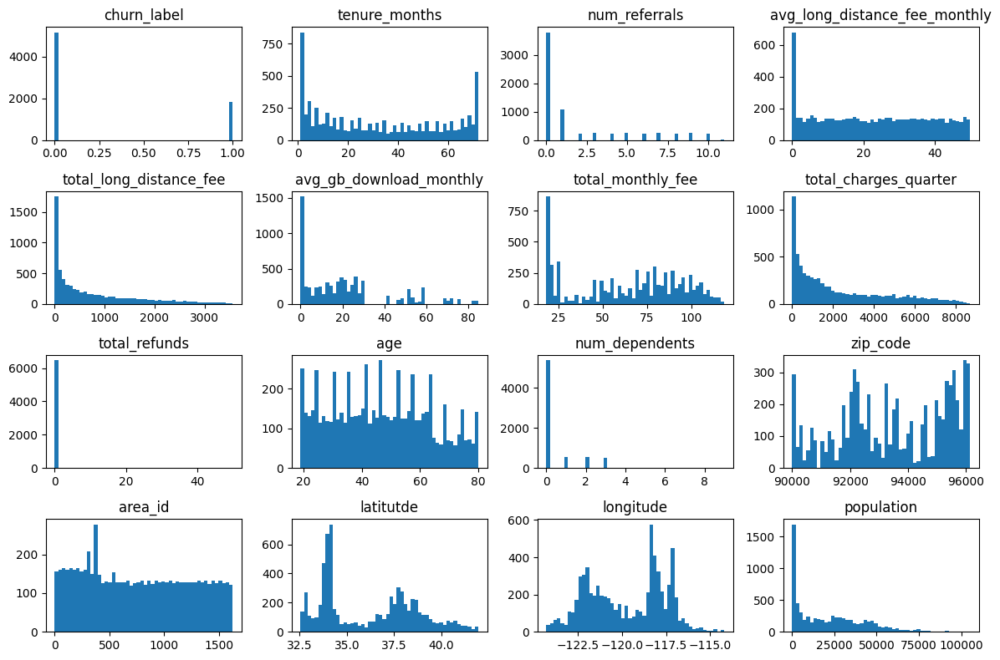

In [13]:
# Step: Plot histograms for numeric columns to view distribution
# Observation:
# 1) Broadly speaking, no visible numerical variable that stands out
# 2) Variables that exhibit skewedness (hence needing log transformation?):
# - `num_referrals` - right / positively skewed (mean < median)
# - `avg_long_distance_fee_monthly` - right / positively skewed (mean < median)
# - `total_long_distance_fee` - right / positively skewed (mean < median)
# - `avg_gb_download_monthly` - generally right / positively skewed (mean < median), but bit weird
# - `total_monthly_fee` - right / positively skewed (mean < median), but bit weird
# - `total_charges_quarter` - right / positively skewed (mean < median)
# - `num_dependents` - right / positively skewed (mean < median)
# - `population` - right / positively skewed (mean < median)
# 3) Others:
# - `tenure_month` to be binned to reflect peaks more clearly (esp the young churning)

num_col.hist(bins=50, figsize=(12, 8), grid=False)
plt.tight_layout()
plt.show()

for column in num_col.columns:
    fig = px.histogram(num_col,
                       color = 'churn_label',
                      x = column)
    fig.show()

In [14]:
# Step: Plot histograms for cat columns to view distribution
# Note: Adding back churn_label into categorical
# Observation: 
# 1) `contract_type` "month-on-month" type contract stands out (i.e., 1612 churned VS 1955)
# 2) `internet_type` "Fiber Option" stands out (i.e., 1201 churned VS 1799)
# 3) However, broadly speaking, no other visible categorical variable stands out

cat_col['churn_label'] = df['churn_label']

for column in cat_col.columns:
    fig = px.histogram(cat_col, color = 'churn_label', x=column)
    fig.update_layout(yaxis_title='Count')
    fig.show()

In [15]:
# Step: Plot co-relation matrix to view correlation
# Observation: 
# 1) Low co-relation between churn_label and total_monthly_fee (0.191)
# 2) Low co-relation between churn_label and age (0.115)

corr_matrix = num_col.corr()
sorted_corr = corr_matrix["churn_label"].sort_values(ascending=False)
sorted_index = sorted_corr.index
sorted_corr_matrix = corr_matrix.loc[sorted_index, sorted_index]

fig1 = px.imshow(sorted_corr_matrix, color_continuous_scale = 'Brwnyl', text_auto = True, height = 800, width = 1000)
fig1.update_xaxes(side="top")
fig1.show()

# Statistical Testing

In [16]:
# Step: Conducting chi-sq testing on all categorical variables (cat_col)
# Note: Converting churn_label back to categorical form for testing FOR CAT_COL ONLY
# (Conversion does not apply to main df)
# Observation:
# (Personal reminder to self on what P-value is: P-value indicates the likelihood of observing
# a chi-sq statistic as extreme or more extreme than expected, if there were no association bet
# the variable and churn_label. This means that if P < 0.01 (True), it means the observed association
# is unlikely due to chance. If P >= 0.01 (False), it indicates the observation may be due to chance.

def change_churn_label_to_cat(churn_label):
    if churn_label == '0':
        return "No"
    else:
        return "Yes"
cat_col['churn_label'] = cat_col['churn_label'].apply(change_churn_label_to_cat)

chi2_results = []
for column in cat_col:
    if column != 'churn_label':
        contingency_table = pd.crosstab(df[column], df['churn_label'])
        chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

        chi2_results.append({
            "Categorical Variable": column,
            "Chi-Square Statistic": chi2_stat,
            "P-Value": p_value,
            "P-Value < 0.01": [
                False if p_value >= 0.01 else True
            ]
        })
chi2_df = pd.DataFrame(chi2_results)
chi2_df

,Categorical Variable,Chi-Square Statistic,P-Value,P-Value < 0.01
0,customer_id,6991.000000,4.943769e-01,[False]
1,status,6991.000000,0.000000e+00,[True]
2,churn_category,6991.000000,0.000000e+00,[True]
3,churn_reason,6991.000000,0.000000e+00,[True]
4,account_id,6991.000000,4.943769e-01,[False]
5,has_internet_service,355.321876,2.939343e-79,[True]
6,internet_type,638.810053,3.885649e-138,[True]
7,has_unlimited_data,187.529810,1.100369e-42,[True]
8,has_phone_service,0.801577,3.706222e-01,[False]
9,has_multiple_lines,11.915284,5.567524e-04,[True]


Insight: variables with significance (minus those from churn table):

Demographics-related
- `senior_citizen`
- `married`

Services-related
- `has_internet_service`
- `internet_type`
- `has_unlimited_data`
- `has_multiple_lines`
- `has_premium_tech_support`
- `has_online_security`
- `has_online_backup`
- `has_device_protection`   
- `stream tv`
- `stream movie`
- `stream_music`

Transaction-related
- `contract_type`
- `paperless_billing`
- `payment_method`   

# Feature Engineering

In [17]:
# Step: Converting cat binary to 0s and 1s. For gender, it will be Male: 0, Female: 1.

cat_binary = ['has_internet_service',
              'has_unlimited_data',
              'has_phone_service',
              'has_multiple_lines',
              'has_premium_tech_support',
              'has_online_security',
              'has_online_backup',
              'has_device_protection',
              'paperless_billing',
              'stream_tv',
              'stream_movie',
              'stream_music',
              'married']
df[cat_binary] = df[cat_binary].replace({'Yes':1,'No':0})
df['gender'] = df['gender'].replace({'Female':1,'Male':0})

In [18]:
# Step: Plot co-relation matrix again AFTER converting cat binary variables to 0s and 1s to see if 
# there are any obviously linear relationships that occur and how strong they might be. 
# This is to complement the earlier statistical tests.
# Observation: 
# 1) Low co-relation between churn_label and has_internet_service (0.225)
# 2) Low co-relation between churn_label and paperless_billing (0.193)
# 3) Low co-relation between churn_label and total_monthly_fee (0.191)
# 4) Low co-relation between churn_label and has_unlimited_data (0.164)
# 5) Low co-relation between churn_label and age (0.115)

num_col = df.select_dtypes(exclude='object')

corr_matrix = num_col.corr()
sorted_corr = corr_matrix["churn_label"].sort_values(ascending=False)
sorted_index = sorted_corr.index
sorted_corr_matrix = corr_matrix.loc[sorted_index, sorted_index]

fig1 = px.imshow(sorted_corr_matrix, color_continuous_scale = 'Brwnyl', text_auto = True, height = 800, width = 1000)
fig1.update_xaxes(side="top")
fig1.show()

In [19]:
# Step: Binning selected range variables
# tenure_months (binning by year?, MIN - 1 MAX - 72) 
# age (binning by broad age groups?, MIN - 19 MAX - 80)
# https://en.wikipedia.org/wiki/Demographics_of_the_United_States

df['tenure_months'] = pd.cut(df['tenure_months'],
                              bins=[0, 12, 24, 36, 48, 60, 72])
df['tenure_months'] = df['tenure_months'].astype('category').cat.codes

df['age'] = pd.cut(df['age'],
                    bins=[15, 25, 35, 45, 55, 65, 75])
df['age'] = df['age'].astype('category').cat.codes

In [20]:
# Step: Normalisation of selected range variables due to right skewedness
# avg_long_distance_fee_monthly (log transform?, MIN - 0.0 MAX - 49.99)
# total_long_distance_fee (log transform?, MIN - 0.0 MAX - 3564.72)
# avg_gb_download_monthly (log transform?, MIN - 0 MAX - 85)
# total_monthly_fee (log transform?, MIN - 18.25 MAX - 118.75)
# total_charges_quarter (log transform?, MIN - 18.8 MAX - 8684.8)
# total_refunds (log transform?, MIN - 0.0 MAX - 49.79)
# population (log transform?, MIN - 11 MAX - 105285)

columns_for_log_transformation = ['avg_long_distance_fee_monthly',
                                 'total_long_distance_fee',
                                 'avg_gb_download_monthly',
                                 'total_monthly_fee',
                                 'total_charges_quarter',
                                 'total_refunds',
                                 'population']

for column in columns_for_log_transformation:
    df[column] = (df[column]+0.01).apply(np.log) 

In [21]:
# Step: Both cat ordinal variables can be skipped for processing since they are already numerical
# i.e., num_referrals and num_dependents are 0-11 and 0-8 each

In [22]:
# Step: Looking at cat cardinal variables (i.e., no order), I will be label encoding the following:
# internet_type (String ("Cable", "DSL", "Fiber optic", or "None"))
# contract_type (String ("Month-to-month", "One year", or "Two year"))
# payment_method (String ("Mailed Check", "Bank Withdrawal", or "Credit Card"))

def change_internet_type(internet_type):
    if internet_type == "None":
        return 0
    elif internet_type == "DSL":
        return 1
    elif internet_type == "Cable":
        return 2
    else:
        return 3
df['internet_type'] = df['internet_type'].apply(change_internet_type)

def change_contract_type(contract_type):
    if contract_type == "Month-to-month":
        return 0
    elif contract_type == "One year":
        return 1
    else:
        return 2
df['contract_type'] = df['contract_type'].apply(change_contract_type)

def change_payment_method(payment_method):
    if payment_method == "Mailed Check":
        return 0
    elif payment_method == "Bank Withdrawal":
        return 1
    else:
        return 2
df['payment_method'] = df['payment_method'].apply(change_payment_method)

In [23]:
# Step: Looking at the remaining cat cardinal variable, zip_code, I will trim it to its first 3 digits, 
# and then will bin it according to area, since between 90000 to 96150 refers to Califonia only
# binned with ref to https://simple.wikipedia.org/wiki/List_of_ZIP_Code_prefixes

for index, code in df['zip_code'].items():
    zip_code_str = str(code)
    first_three_digits = zip_code_str[0:3]
    df.loc[index, 'zip_code'] = int(first_three_digits)
    
df['zip_code'] = pd.cut(df['zip_code'],
                    bins=[900, 902, 906, 910, 913, 917, 919, 922, 923, 926, 930, 931, 935, 936, 939, 940,
                          945, 949, 950, 952, 954, 955, 956, 959, 960, 961])
df['zip_code'] = df['zip_code'].astype('category').cat.codes

In [24]:
# Step: Checking df
df

,customer_id,status,churn_label,churn_category,churn_reason,account_id,tenure_months,num_referrals,has_internet_service,internet_type,...,age,senior_citizen,married,num_dependents,zip_code,area_id,city,latitutde,longitude,population
0,0013-EXCHZ,Churned,1,Dissatisfaction,Network reliability,BFIN-DLMOA,0,3,1,3,...,5,Yes,1,0,9,607,Camarillo,34.227846,-119.079903,10.665531
1,0014-BMAQU,Stayed,0,,,AFEO-XOOCP,5,8,1,3,...,3,No,1,0,15,963,Napa,38.489789,-122.270110,11.065810
2,0016-QLJIS,Stayed,0,,,DEMQ-MFXWC,5,3,1,2,...,2,No,1,1,21,1390,Sheridan,38.984756,-121.345074,7.105794
3,0019-EFAEP,Stayed,0,,,AIPP-VTDXJ,5,0,1,3,...,1,No,0,0,5,303,La Mesa,32.782501,-117.016110,10.086018
4,0019-GFNTW,Stayed,0,,,CJHA-SRKIB,4,0,1,1,...,2,No,0,0,11,716,Los Olivos,34.704340,-120.026090,7.183119
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6986,9848-JQJTX,Stayed,0,,,ZTCJ-AYASC,5,0,1,3,...,3,No,0,0,0,94,Venice,33.991782,-118.479229,10.342420
6987,9921-ZVRHG,Churned,1,Competitor,Competitor had better devices,WKQW-QPWUM,1,0,1,3,...,2,No,0,0,12,819,Traver,36.456091,-119.486225,6.470815
6988,9938-TKDGL,Stayed,0,,,VKPX-MVNBC,5,9,1,3,...,2,No,1,3,11,755,Llano,34.500091,-117.765862,7.106614
6989,9938-ZREHM,Stayed,0,,,PQGJ-VYMBE,3,4,1,1,...,2,No,1,0,9,615,Oxnard,34.156629,-119.117218,11.261781


In [25]:
# Step: Checking df
for col in df.columns:
    value_counts_series = df[col].value_counts().sort_index()
    number_unique = len(value_counts_series)
    if number_unique < 20:
        print(value_counts_series)
    else:
        print(col, "-", number_unique, "unique values -", df[col].dtype)
        print(list(value_counts_series.index)[:100], ", ...")
        min_value = (value_counts_series.index)[0]
        max_value = (value_counts_series.index)[-1]
        print(f"MIN - {min_value} MAX - {max_value}")
    print("==========================================")

customer_id - 6991 unique values - object
['0002-ORFBO', '0003-MKNFE', '0004-TLHLJ', '0011-IGKFF', '0013-EXCHZ', '0013-MHZWF', '0013-SMEOE', '0014-BMAQU', '0015-UOCOJ', '0016-QLJIS', '0017-DINOC', '0017-IUDMW', '0018-NYROU', '0019-EFAEP', '0019-GFNTW', '0020-INWCK', '0020-JDNXP', '0021-IKXGC', '0022-TCJCI', '0023-HGHWL', '0023-UYUPN', '0023-XUOPT', '0027-KWYKW', '0030-FNXPP', '0031-PVLZI', '0032-PGELS', '0036-IHMOT', '0040-HALCW', '0042-JVWOJ', '0042-RLHYP', '0048-LUMLS', '0048-PIHNL', '0052-DCKON', '0052-YNYOT', '0056-EPFBG', '0057-QBUQH', '0058-EVZWM', '0060-FUALY', '0064-SUDOG', '0064-YIJGF', '0067-DKWBL', '0068-FIGTF', '0071-NDAFP', '0074-HDKDG', '0076-LVEPS', '0078-XZMHT', '0080-EMYVY', '0080-OROZO', '0082-LDZUE', '0082-OQIQY', '0083-PIVIK', '0089-IIQKO', '0093-EXYQL', '0093-XWZFY', '0094-OIFMO', '0096-BXERS', '0096-FCPUF', '0098-BOWSO', '0100-DUVFC', '0103-CSITQ', '0104-PPXDV', '0106-GHRQR', '0106-UGRDO', '0107-WESLM', '0107-YHINA', '0111-KLBQG', '0112-QAWRZ', '0112-QWPNC', '0114

In [26]:
# Step: Dropping columns from df before using random forest to analyse the variables for importance
columns_to_drop = ['status',
                   'churn_category',
                   'churn_reason',
                   'senior_citizen',
                   'area_id',
                   'city',
                   'latitutde',
                   'longitude',
                   'account_id',
                   'customer_id']
df = df.drop(columns_to_drop, axis=1)

In [27]:
X = df.drop('churn_label', axis=1)
y = df['churn_label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

random_forest_model = RandomForestClassifier(random_state=42, n_estimators=100)
random_forest_model.fit(X_train, y_train)
y_pred = random_forest_model.predict(X_test)

feature_importances = pd.DataFrame({'feature': X.columns, 'importance': random_forest_model.feature_importances_})
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

feature_importances_df = pd.DataFrame(feature_importances)
feature_importances_df

,feature,importance
21,total_charges_quarter,0.122837
20,total_monthly_fee,0.097815
15,total_long_distance_fee,0.081778
1,num_referrals,0.077026
28,population,0.069796
14,avg_long_distance_fee_monthly,0.066319
16,avg_gb_download_monthly,0.063988
0,tenure_months,0.061104
27,zip_code,0.054666
3,internet_type,0.040344


In [28]:
fig = px.bar(feature_importances, x='feature', y='importance')
fig.show()

Insight: the following features had a higher relative rank with respect to the predictability of the target
variable churn_label:
- `total_charges_quarter` - 0.122837
- `total_monthly_fee` - 0.097815
- `total_long_distance_fee` - 0.081778
- `num_referrals` - 0.077026
- `population` - 0.069796
- `avg_long_distance_fee_monthly` - 0.066319
- `avg_gb_download_monthly` - 0.063988
- `tenure_months` - 0.061104
- `zip_code` - 0.054666

Personal reminder on what random_forest_model.feature_importances_ does: 
https://scikit-learn.org/stable/modules/ensemble.html#feature-importance-evaluation

# Model Building (finally)

In [29]:
# Step: List of initial features from random forest feature importance, corr matrix and chi2 test
total_feature_list = ['total_charges_quarter',
                'total_monthly_fee',
                'total_long_distance_fee',
                'num_referrals',
                'population',
                'avg_long_distance_fee_monthly',
                'avg_gb_download_monthly',
                'tenure_months',
                'zip_code',
                'has_internet_service',
                'paperless_billing', 
                'has_unlimited_data',
                'age', 
                'married',
                'has_multiple_lines',
                'has_premium_tech_support',
                'has_online_security',
                'has_online_backup',
                'has_device_protection',  
                'stream_tv',
                'stream_movie',
                'stream_music',
                'contract_type',
                'payment_method'
               ]

#Corr Matrix
# has_internet_service (0.225)
# paperless_billing (0.193)
# has_unlimited_data (0.164)
# age (0.115)

#CHI2
# married
# has_multiple_lines
# has_premium_tech_support
# has_online_security
# has_online_backup
# has_device_protection  
# stream_tv
# stream_movie
# stream_music
# contract_type
# payment_method

In [30]:
# Step: Curating the key features further as there are way too many

#'total_charges_quarter' - to drop, overlap with total_monthly_fee
#'total_monthly_fee'
#'total_long_distance_fee' - to drop, travelers may choose other means of getting data when overseas
#'num_referrals'
#'population' - to drop, population size does not seem to relate to churn
#'avg_long_distance_fee_monthly' - to drop, travelers may choose other means of getting data when overseas
#'avg_gb_download_monthly' - to drop. Download amounts means a power user but does not mean no churn
#'tenure_months'
#'zip_code'
#'has_internet_service'
#'paperless_billing' - to drop, seems like a standalone benefit that may not cause churn
#'has_unlimited_data' - to drop. Unlimited data is something other telcos may offer to
#'age'
#'married' - to drop, not sure what marriage status has to do with churn
#'has_multiple_lines' - to drop, part of periphery services that other telcos may offer to
#'has_premium_tech_support' - to drop, part of periphery services that other telcos may offer to
#'has_online_security' - to drop, part of periphery services that other telcos may offer to
#'has_online_backup' - to drop, part of periphery services that other telcos may offer to
#'has_device_protection' - to drop, part of periphery services that other telcos may offer to
#'stream_tv' - to drop, part of periphery services that other telcos may offer to
#'stream_movie' - to drop, part of periphery services that other telcos may offer to
#'stream_music' - to drop, part of periphery services that other telcos may offer to
#'contract_type'
#'payment_method'

curated_features = ['total_monthly_fee',
                'num_referrals',
                'tenure_months',
                'zip_code',
                'has_internet_service',
                'age',
                'contract_type',
                'payment_method'
               ]

In [31]:
# Step: Train-test split
X = df[curated_features]
y = df['churn_label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [32]:
# Step: XGB
XGB_model = XGBClassifier(learning_rate=0.01, random_state=42)
XGB_model.fit(X_train, y_train)
y_predict = XGB_model.predict(X_test)
xgb_accuracy_test = metrics.accuracy_score(y_test, y_predict)

In [33]:
# Step: Cat Boost
cat_model = CatBoostClassifier(random_state=42, verbose=0)
cat_model.fit(X_train, y_train)
y_predict = cat_model.predict(X_test)
cat_accuracy_test = metrics.accuracy_score(y_test, y_predict)

In [34]:
# Step: Print
print("XGB accuracy:", xgb_accuracy_test)
print("Cat Boost accuracy:", cat_accuracy_test)

XGB accuracy: 0.7836034318398475
Cat Boost accuracy: 0.8069590085795996


In [35]:
# Step: Plotting AUC curve
# Observation: Cat Boost proves slightly superior to XGB. Will focus on Cat Boost.

XGB_prob = XGB_model.predict_proba(X_test)[:,1]
Cat_prob = cat_model.predict_proba(X_test)[:,1]

models = {'XGB': XGB_prob,
          'Cat Boost': Cat_prob}

fig = go.Figure()

for model_name, pred_probs in models.items():
    auc_score = roc_auc_score(y_test, pred_probs)
    fpr, tpr, thresholds = roc_curve(y_test, pred_probs)
    fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines',
                            name=f'{model_name} (AUC={auc_score:.5f})'
                            )) 

fig.update_layout(title='ROC Curve',
                  xaxis_title='False Positive Rate',
                  yaxis_title='True Positive Rate'
              )
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain', range=[0, 1], tickvals=[0,0.5,1])
fig.update_yaxes(constrain='domain', range=[0, 1.05])

fig.add_trace(go.Scatter(
        x=[0,1], y=[0,1],
        mode='lines',
        line=dict(dash='dash', color='black'),
        showlegend=False))
fig.show()

In [36]:
random_grid_catboost = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'depth': [3, 4, 5],
    'l2_leaf_reg': [1, 3, 5],
    'bagging_temperature': [0.1, 0.2, 0.3],
    'border_count': [32, 50, 100]
}

random_search = RandomizedSearchCV(estimator=cat_model, param_distributions=random_grid_catboost,
                                 cv=3, scoring='accuracy', n_jobs=-1)
random_search.fit(X_train, y_train)

best_params = random_search.best_params_
best_model = random_search.best_estimator_
print("Best Parameters:", best_params)
print("Best Model:", best_model)

Best Parameters: {'learning_rate': 0.1, 'l2_leaf_reg': 3, 'iterations': 100, 'depth': 4, 'border_count': 100, 'bagging_temperature': 0.1}
Best Model: <catboost.core.CatBoostClassifier object at 0x0000023AA342AE20>


In [37]:
cat_model = CatBoostClassifier(learning_rate=0.1, 
                               l2_leaf_reg=3,
                               iterations=100,
                               depth=5,
                               border_count=50,
                               bagging_temperature=0.3,
                               random_state=42, 
                               verbose=0)
cat_model.fit(X_train, y_train)
y_predict = cat_model.predict(X_test)
cat_accuracy_test = metrics.accuracy_score(y_test, y_predict)
print("Cat Boost accuracy:", cat_accuracy_test)

Cat Boost accuracy: 0.8122020972354623


In [38]:
Cat_prob = cat_model.predict_proba(X_test)[:,1]

models = {'Cat Boost': Cat_prob}

fig = go.Figure()

for model_name, pred_probs in models.items():
    auc_score = roc_auc_score(y_test, pred_probs)
    fpr, tpr, thresholds = roc_curve(y_test, pred_probs)
    fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines',
                            name=f'{model_name} (AUC={auc_score:.5f})'
                            )) 

fig.update_layout(title='ROC Curve',
                  xaxis_title='False Positive Rate',
                  yaxis_title='True Positive Rate'
              )
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain', range=[0, 1], tickvals=[0,0.5,1])
fig.update_yaxes(constrain='domain', range=[0, 1.05])

fig.add_trace(go.Scatter(
        x=[0,1], y=[0,1],
        mode='lines',
        line=dict(dash='dash', color='black'),
        showlegend=False))
fig.show()

In [39]:
# Conclusion: AUC increased to 0.86578 from 0.85785. This model will be used.

# Re-fit final model

In [40]:
#Step: Re-fit entire df on the curated variables and final model params

X = df[curated_features]
y = df['churn_label']

print(len(X))
print(len(y))

final_cat_model = CatBoostClassifier(
    learning_rate=0.1, 
    l2_leaf_reg=3,
    iterations=100,
    depth=5,
    border_count=50,
    bagging_temperature=0.3,
    random_state=42, 
    verbose=0)

final_cat_model.fit(X, y)

6991
6991


# Export model

In [41]:
# Path("../model").mkdir(exist_ok=True)

In [42]:
# joblib.dump(final_cat_model, '../model/capstone_catboost_model.pkl')

['../model/capstone_catboost_model.pkl']

# Others

In [43]:
# # # Note: Decided to forgo GridSearch for RandomSearch as GridSearch was taking too long
# # # Step: Using grid search to optimise params for cat boost
# param_grid = {
#     'iterations': [100, 200, 500],      
#     'learning_rate': [0.01, 0.1, 0.2],
#     'depth': [4, 6, 8],              
#     'l2_leaf_reg': [1, 3, 5], 
#     'border_count': [32, 50, 100],
#     'bagging_temperature': [1, 5, 10],
# }

# grid_search = GridSearchCV(estimator=cat_model, param_grid=param_grid, cv=3, scoring='accuracy')
# grid_search.fit(X_train, y_train)
# print("Best Parameters: ", grid_search.best_params_)
# print("Best Accuracy: ", grid_search.best_score_)

# y_pred = grid_search.predict(X_test)
# print("Test Accuracy: ", accuracy_score(y_test, y_pred))